# Grab omero images

In [2]:
import matplotlib.pyplot as plt
from omero.gateway import BlitzGateway, MapAnnotationWrapper
import numpy as np
from lavlab.omero.tiles import create_tile_list_from_image, get_tiles, create_tile_list_2d
from lavlab.python_util import create_array
from lavlab.imsuite import imresize
from scipy.ndimage import gaussian_filter
from skimage import filters, measure, color, morphology
from skimage.color import rgb2hsv
from tqdm import tqdm
#
from skimage.color import rgb2hed, hed2rgb
from skimage.exposure import rescale_intensity
import skimage as ski

from skimage.measure import block_reduce
from skimage.morphology import closing, square


import lavlab
from lavlab.omero.images import mask_omero_tissue_loosely

In [3]:
import omero.gateway
import numpy as np
import threading
from typing import Generator, Optional
import lavlab

def get_rgb_tiles(  # pylint: disable=R0914
    img: omero.gateway.Image,
    tiles: list[tuple[int, int, int, tuple[int, int, int, int]]],
    res_lvl: Optional[int] = None,
    rps_bypass: bool = True,
    conn: omero.gateway.BlitzGateway = None,
) -> Generator[
    tuple[np.ndarray, tuple[int, int, int, tuple[int, int, int, int]]], None, None
]:
    """Pull tiles from omero faster using a ThreadPoolExecutor and executor.map!
 
    Parameters
    ----------
    img : omero.gateway.Image
        Omero image.
    tiles : list of tuple[int, int, int, tuple[int, int, int, int]]
        List of tiles to pull.
    res_lvl : int, optional
        Resolution level to pull, defaults to None.
    rps_bypass : bool, optional
        Passthrough to rps bypass option, defaults to True.
    conn : omero.gateway.BlitzGateway, optional
        Omero blitz gateway if not using omero image object, defaults to None.
 
    Yields
    ------
    tuple[np.ndarray, tuple[int, int, int, tuple[int, int, int, int]]]
        Tile and coords.
    """
    with lavlab.ctx.resources.io_pool as tpe:
        if conn is None:
            conn = img._conn  # pylint: disable=W0212
        local = threading.local()
 
        def work(args):
            """Runs inside a thread pool to get multiple tiles at a time."""
            pix_id, zct, coord, res_lvl, rps_bypass = args
            if getattr(local, "rps", None) is None:
                # Need to prepare a thread-specific rps
                local.rps = conn.c.sf.createRawPixelsStore()
                local.rps.setPixelsId(pix_id, rps_bypass)
                if res_lvl is None:
                    res_lvl = local.rps.getResolutionLevels()
                    res_lvl -= 1
                local.rps.setResolutionLevel(res_lvl)
            z, c, t = zct
            raw_data = []
            for c in range(3):
                raw_data.append(local.rps.getTile(z,c,t, *coord))
            return raw_data, (*zct, coord)
 
        def cleanup():
            """Cleans out the raw pixels stores after work is done."""
            if hasattr(local, "rps"):
                local.rps.close()
                delattr(local, "rps")
 
        try:
            # Use executor.map for streamlined processing
            pix_id = img.getPrimaryPixels().getId()
            tiles = tiles[0]
            args_iter = ((pix_id, (z, c, t), coord, res_lvl, rps_bypass) for z, c, t, coord in tiles)
            for raw_data, (z, c, t, coord) in tpe.map(work, args_iter):
                processed_data = np.zeros((coord[3], coord[2],3), dtype=np.uint8)
                for i, data in enumerate(raw_data):
                    np_data = np.frombuffer(data, dtype=np.uint8).reshape(coord[3], coord[2])
                    processed_data[:,:,i] = np_data
                yield processed_data, (z, c, t, coord)
        finally:
            # Cleanup resources
            for _ in range(tpe._max_workers):  # pylint: disable=W0212
                cleanup()

In [138]:
conn = BlitzGateway("bchao", "100Freestyle!", host="wss://wsi.lavlab.mcw.edu/omero-wss", port=443, secure=True)
conn.connect()
conn.c.enableKeepAlive(60000000)

image_id = 574

image = conn.getObject("Image", image_id)
if image is None:
    print(f"Image with ID {image_id} not found.")
    conn.close()
    exit()

tile_list = create_tile_list_from_image(image, rgb=True)

In [139]:
#test
print(len(tile_list[0]))

57105


In [140]:
# Get image dimensions from metadata
image_width = image.getSizeX()
image_height = image.getSizeY()
num_z = image.getSizeZ()
num_c = image.getSizeC()
num_t = image.getSizeT()

In [7]:
#test
print(tile_list[0][900])
print(tile_list[1][900])
print(tile_list[2][900])
# tile = np array z=slice(always 0) c=channel(0=red, 1=green, 2=blue) t=timepoint(always 0) x = start in x axis y = start in y axis w = tile width h = height (goes top left to bottom right)

(0, 0, 0, (199680, 3072, 1024, 1024))
(0, 1, 0, (199680, 3072, 1024, 1024))
(0, 2, 0, (199680, 3072, 1024, 1024))


In [141]:
tile1 = get_tiles(image, [tile_list[0][31010],tile_list[1][31010],tile_list[2][31010]])
position_x1, position_y1, size1 = int(tile_list[0][31010][3][0]/1024), int(tile_list[0][31010][3][1]/1024), int(tile_list[0][31010][3][2] * tile_list[0][31010][3][3])

tile2 = get_tiles(image, [tile_list[0][41010],tile_list[1][41010],tile_list[2][41010]])
position_x2, position_y2, size2 = int(tile_list[0][41010][3][0]/1024), int(tile_list[0][41010][3][1]/1024), int(tile_list[0][41010][3][2] * tile_list[0][41010][3][3])

tile3 = get_tiles(image, [tile_list[0][36010],tile_list[1][36010],tile_list[2][36010]])
position_x3, position_y3, size3 = int(tile_list[0][36010][3][0]/1024), int(tile_list[0][36010][3][1]/1024), int(tile_list[0][36010][3][2] * tile_list[0][36010][3][3])

tile4 = get_tiles(image, [tile_list[0][38010],tile_list[1][38010],tile_list[2][38010]])
position_x4, position_y4, size4 = int(tile_list[0][38010][3][0]/1024), int(tile_list[0][38010][3][1]/1024), int(tile_list[0][38010][3][2] * tile_list[0][38010][3][3])

tile5 = get_tiles(image, [tile_list[0][21010],tile_list[1][21010],tile_list[2][21010]])
position_x5, position_y5, size5 = int(tile_list[0][21010][3][0]/1024), int(tile_list[0][21010][3][1]/1024), int(tile_list[0][21010][3][2] * tile_list[0][21010][3][3])

tile6 = get_tiles(image, [tile_list[0][16010],tile_list[1][16010],tile_list[2][16010]])
position_x6, position_y6, size6 = int(tile_list[0][16010][3][0]/1024), int(tile_list[0][16010][3][1]/1024), int(tile_list[0][16010][3][2] * tile_list[0][16010][3][3])

In [142]:
#test
print(image_width)
print(position_y1)
print(int(np.ceil(image_width/1024)))
print(int(np.ceil(image_height/1024)))
print(size)

240553
131
235
243
1048576


In [143]:
heat_dab_count = np.zeros((int(np.ceil(image_width/1024)), int(np.ceil(image_height/1024))))
heat_nuc_count = np.zeros((int(np.ceil(image_width/1024)), int(np.ceil(image_height/1024))))
heat_ratio = np.zeros((int(np.ceil(image_width/1024)), int(np.ceil(image_height/1024))))

In [144]:
tiles = [tile1, tile2, tile3, tile4, tile5, tile6]
small_images = []
for tile in tiles:
    small_image = []
    for pic in tile:
        small_image.append(pic[0])
    small_image = np.array(small_image)
    small_image = np.transpose(small_image, (1, 2, 0))
    small_images.append(small_image)


In [149]:
small_images[0].shape

(1024, 1024, 3)

In [46]:
block_size = (2,2)
down_image_2 = np.zeros((small_image.shape[0]//block_size[0], small_image.shape[0]//block_size[0],3),dtype=np.uint8)
for i in range(3):
    down_image_2[:,:,i] = ski.measure.block_reduce(small_image[:,:,i], block_size = 2, func=np.mean)

block_size = (4,4)
down_image_4 = np.zeros((small_image.shape[0]//block_size[0], small_image.shape[0]//block_size[0],3),dtype=np.uint8)
for i in range(3):
    down_image_4[:,:,i] = ski.measure.block_reduce(small_image[:,:,i], block_size = 4, func=np.mean)

block_size = (8,8)
down_image_8 = np.zeros((small_image.shape[0]//block_size[0], small_image.shape[0]//block_size[0],3),dtype=np.uint8)
for i in range(3):
    down_image_8[:,:,i] = ski.measure.block_reduce(small_image[:,:,i], block_size = 8, func=np.mean)

In [148]:
block_size = (8,8)
down_images_8 = []
for small_image in small_images:
    down_image_8 = np.zeros((small_image.shape[0]//block_size[0], small_image.shape[0]//block_size[0],3),dtype=np.uint8)
    for i in range(3):
        down_image_8[:,:,i] = ski.measure.block_reduce(small_image[:,:,i], block_size = 8, func=np.mean)
    down_images_8.append(down_image_8)

In [150]:
down_images_8[0].shape

(128, 128, 3)

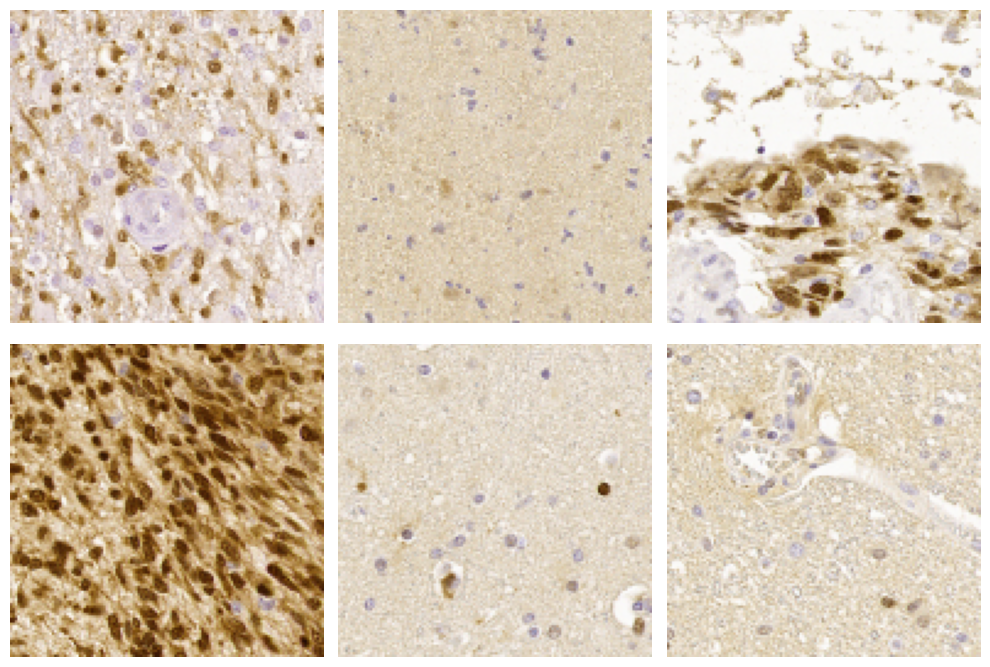

In [151]:
#display
import matplotlib.pyplot as plt

# Assuming down_images_8 is a list containing 6 images of shape (128,128,3)
fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for i, ax in enumerate(axes.flat):
    ax.imshow(down_images_8[i])
    ax.axis("off")  # Hide axes for better visualization

plt.tight_layout()
plt.show()


In [47]:
#test
print(small_image.shape)
print(down_image_2.shape)
print(down_image_4.shape)
print(down_image_8.shape)

(1024, 1024, 3)
(512, 512, 3)
(256, 256, 3)
(128, 128, 3)


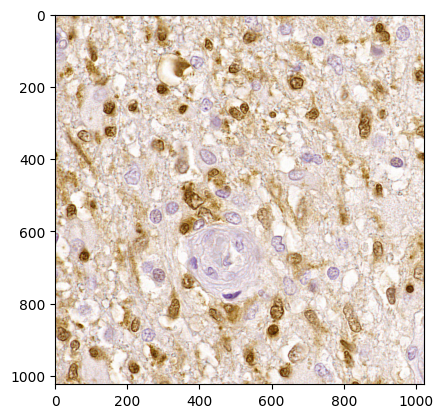

In [48]:
#Display
plt.imshow(small_image)

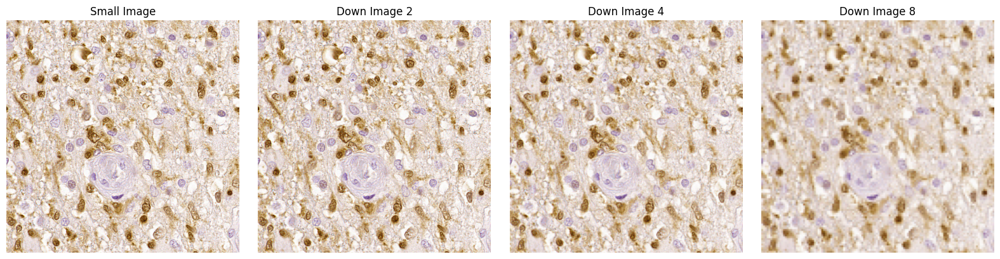

In [50]:
#Display
# Assuming small_image, down_image_2, down_image_4, and down_image_8 are NumPy arrays
images = [small_image, down_image_2, down_image_4, down_image_8]
titles = ["Small Image", "Down Image 2", "Down Image 4", "Down Image 8"]

# Create a figure with subplots (1 row, 4 columns)
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Loop through images and display them
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap="gray")  # Use 'gray' if images are grayscale
    ax.set_title(title)
    ax.axis("off")  # Hide axis

plt.tight_layout()
plt.show()

In [52]:
hed_small = rgb2hed(small_image)
null = np.zeros_like(hed_small[:, :, 0])
ihc_h = hed2rgb(np.stack((hed_small[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, hed_small[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, hed_small[:, :, 2]), axis=-1))

hed_down_2 = rgb2hed(down_image_2)
null_d2 = np.zeros_like(hed_down_2[:, :, 0])
ihc_h_d2 = hed2rgb(np.stack((hed_down_2[:, :, 0], null_d2, null_d2), axis=-1))
ihc_e_d2 = hed2rgb(np.stack((null_d2, hed_down_2[:, :, 1], null_d2), axis=-1))
ihc_d_d2 = hed2rgb(np.stack((null_d2, null_d2, hed_down_2[:, :, 2]), axis=-1))

hed_down_4 = rgb2hed(down_image_4)
null_d4 = np.zeros_like(hed_down_4[:, :, 0])
ihc_h_d4 = hed2rgb(np.stack((hed_down_4[:, :, 0], null_d4, null_d4), axis=-1))
ihc_e_d4 = hed2rgb(np.stack((null_d4, hed_down_4[:, :, 1], null_d4), axis=-1))
ihc_d_d4 = hed2rgb(np.stack((null_d4, null_d4, hed_down_4[:, :, 2]), axis=-1))

hed_down_8 = rgb2hed(down_image_8)
null_d8 = np.zeros_like(hed_down_8[:, :, 0])
ihc_h_d8 = hed2rgb(np.stack((hed_down_8[:, :, 0], null_d8, null_d8), axis=-1))
ihc_e_d8 = hed2rgb(np.stack((null_d8, hed_down_8[:, :, 1], null_d8), axis=-1))
ihc_d_d8 = hed2rgb(np.stack((null_d8, null_d8, hed_down_8[:, :, 2]), axis=-1))

In [181]:
binary_otsu_edits = []
blobs_logs = []
min_threshold = 0.1
for down_image_8 in down_images_8:
    hed_down_8 = rgb2hed(down_image_8)
    dab = hed_down_8[:,:,2]
    hem = hed_down_8[:,:,0]
    thresh_otsu_dab = ski.filters.threshold_otsu(dab)
    binary_otsu_dab = (dab > thresh_otsu_dab) & (dab > min_threshold)
    thresh_otsu_hem = ski.filters.threshold_otsu(hem)
    binary_otsu_hem = hem > thresh_otsu_hem
    binary_otsu_edit = morphology.remove_small_objects(binary_otsu_dab, min_size=4)
    binary_otsu_edits.append(binary_otsu_edit)
    blobs_log = ski.feature.blob_log(hem, min_sigma=2.125, max_sigma=5, threshold=0.004)
    blobs_log[:,2] *= np.sqrt(2)
    blobs_logs.append(blobs_log)
    labeled_dab = ski.measure.label(binary_otsu_edit)
    dab_count = labeled_dab.max()
    

In [168]:
print(len(binary_otsu_edits))
print(len(blobs_logs))

6
6


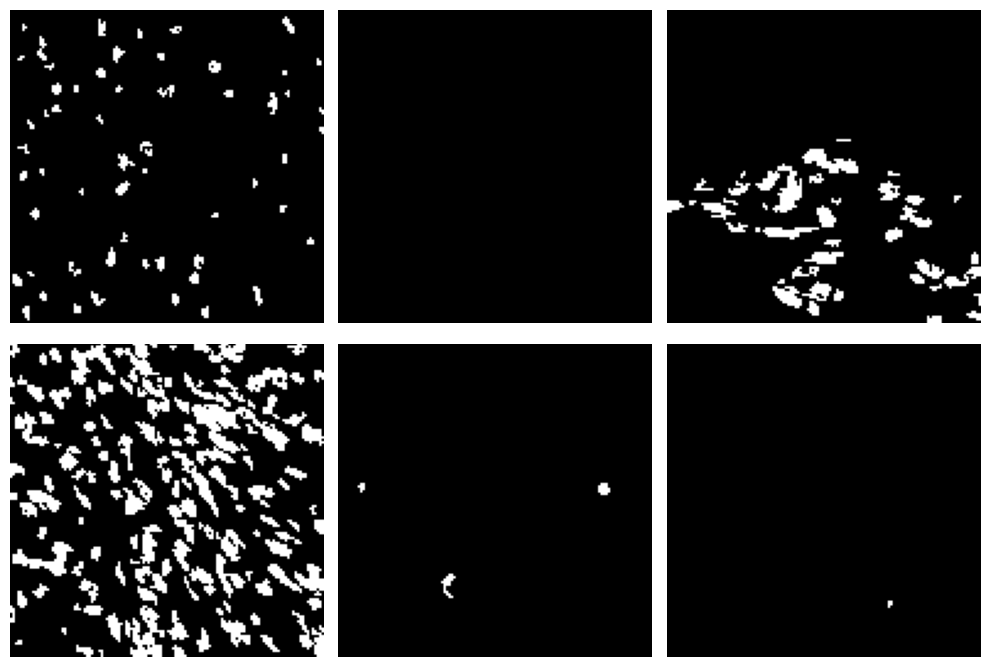

In [182]:
fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for i, ax in enumerate(axes.flat):
    ax.imshow(binary_otsu_edits[i], cmap="gray")  # Display in grayscale
    ax.axis("off")  # Hide axes for better visualization

plt.tight_layout()
plt.show()

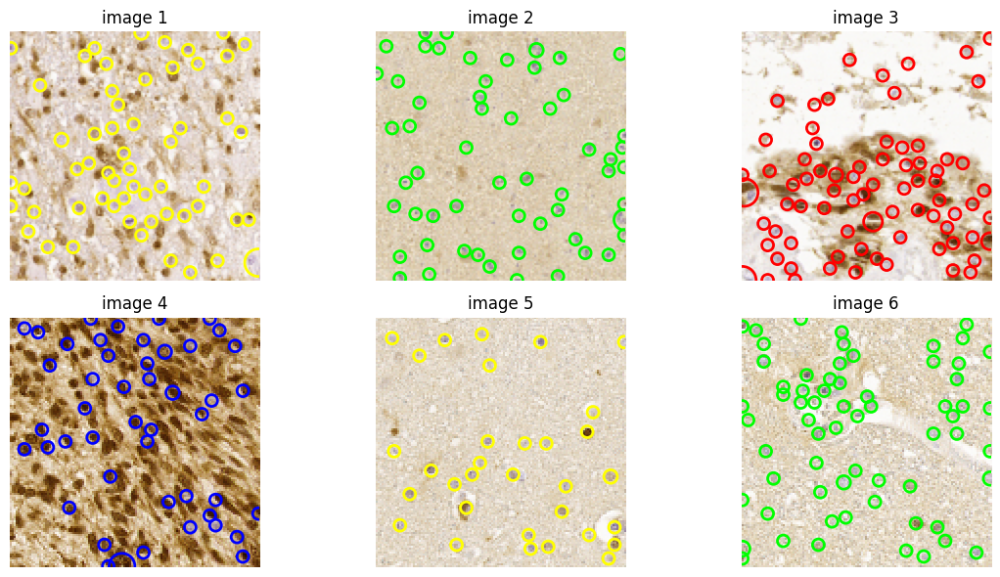

In [183]:
#display
colors = ['yellow', 'lime', 'red', 'blue', 'yellow', 'lime']
titles = ['image 1', 'image 2', 'image 3', 'image 4', 'image 5', 'image 6']

# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
ax = axes.ravel()

# Loop through images and blobs
for idx, (blobs, img, color, title) in enumerate(zip(blobs_logs, down_images_8, colors, titles)):
    ax[idx].set_title(title)
    ax[idx].imshow(img, cmap='gray')  # Show the corresponding image
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

In [59]:
#test
print(hed_small.shape)
print(hed_down_2.shape)
print(hed_down_4.shape)
print(hed_down_8.shape)

(1024, 1024, 3)
(512, 512, 3)
(256, 256, 3)
(128, 128, 3)


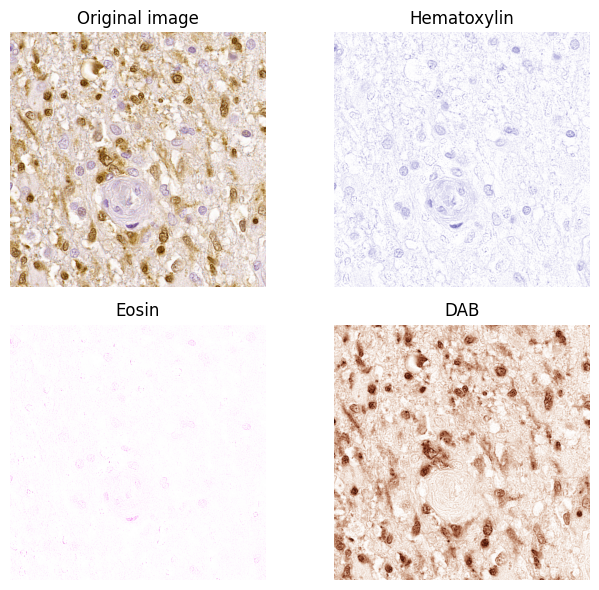

In [28]:
# Display
fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(small_image)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

In [129]:
hed_small.shape

dab = hed_small[:,:,2]
hem = hed_small[:,:,0]
thresh_tri_dab = ski.filters.threshold_triangle(dab)
binary_tri_dab = dab > thresh_tri_dab
thresh_otsu_hem = ski.filters.threshold_otsu(hem)
binary_otsu_hem = hem > thresh_otsu_hem

dab_d2 = hed_down_2[:,:,2]
hem_d2 = hed_down_2[:,:,0]
thresh_tri_dab_d2 = ski.filters.threshold_triangle(dab_d2)
binary_tri_dab_d2 = dab_d2 > thresh_tri_dab_d2
thresh_otsu_hem_d2 = ski.filters.threshold_otsu(hem_d2)
binary_otsu_hem_d2 = hem_d2 > thresh_otsu_hem_d2

dab_d4 = hed_down_4[:,:,2]
hem_d4 = hed_down_4[:,:,0]
thresh_tri_dab_d4 = ski.filters.threshold_triangle(dab_d4)
binary_tri_dab_d4 = dab_d4 > thresh_tri_dab_d4
thresh_otsu_hem_d4 = ski.filters.threshold_otsu(hem_d4)
binary_otsu_hem_d4 = hem_d4 > thresh_otsu_hem_d4

dab_d8 = hed_down_8[:,:,2]
hem_d8 = hed_down_8[:,:,0]
thresh_otsu_dab_d8 = ski.filters.threshold_otsu(dab_d8)
binary_otsu_dab_d8 = dab_d8 > thresh_otsu_dab_d8
thresh_otsu_hem_d8 = ski.filters.threshold_otsu(hem_d8)
binary_otsu_hem_d8 = hem_d8 > thresh_otsu_hem_d8

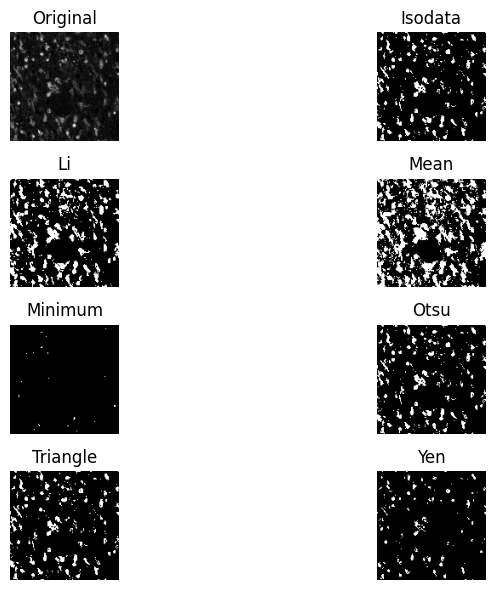

In [104]:
#display
fig, ax = ski.filters.try_all_threshold(dab_d8, figsize=(10, 6), verbose=False)

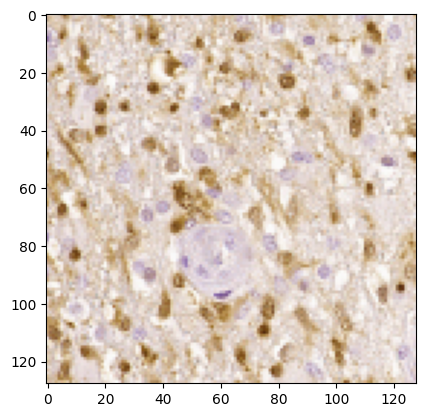

In [130]:
#display
plt.imshow(down_image_8)

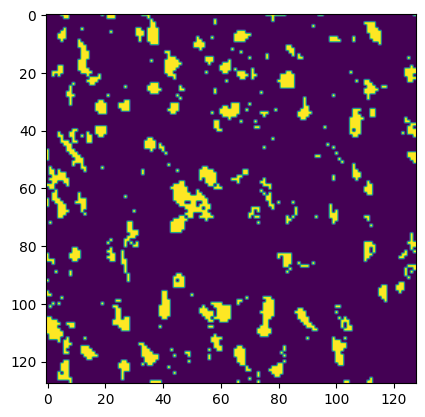

In [131]:
#display
dab_d8 = hed_down_8[:,:,2]
thresh_otsu_dab_d8 = ski.filters.threshold_otsu(dab_d8)
binary_otsu_dab_d8 = dab_d8 > thresh_otsu_dab_d8

plt.imshow(binary_otsu_dab_d8)

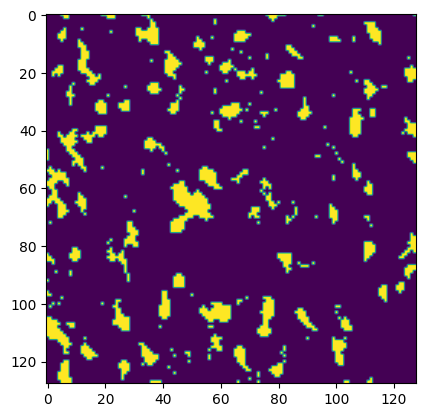

In [132]:
#display
cleaned_tri_dab_d8 = closing(binary_otsu_dab_d8)

plt.imshow(cleaned_tri_dab_d8)

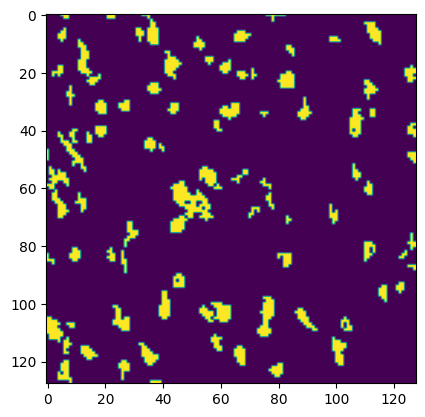

In [133]:
#display
binary_otsu_edit_d8 = morphology.remove_small_objects(binary_otsu_dab_d8, min_size=4)

plt.imshow(binary_otsu_edit_d8)

In [134]:
labeled_dab = ski.measure.label(binary_otsu_edit_d8)
dab_count = labeled_dab.max()
print(dab_count)

83


In [82]:
#test
print(hem_d4.shape)

(256, 256)


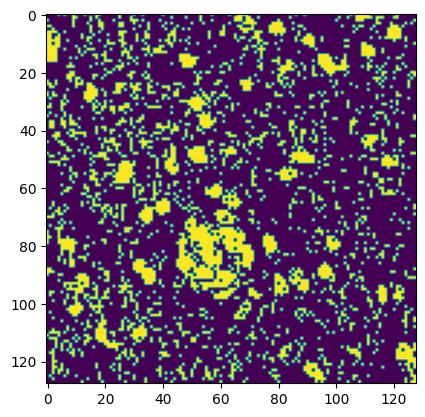

In [72]:
#display
plt.imshow(binary_otsu_hem_d8)

In [117]:
cleaned_tri_dab = closing(binary_tri_dab, square(3))
cleaned_tri_dab_d2 = closing(binary_tri_dab_d2, square(3))
cleaned_tri_dab_d4 = closing(binary_tri_dab_d4, square(3))
cleaned_tri_dab_d8 = closing(binary_tri_dab_d8, square(3))


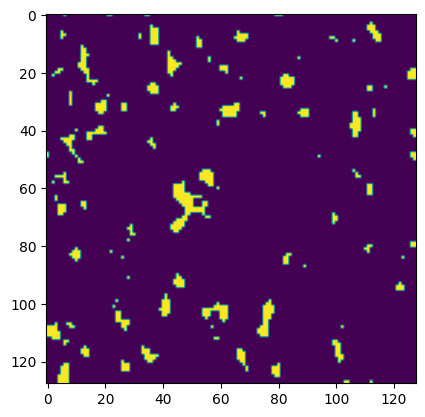

In [118]:
#display
plt.imshow(cleaned_tri_dab_d8)

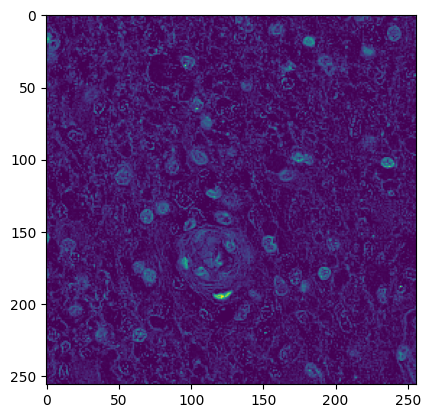

In [84]:
#display
plt.imshow(hem_d4)

LOG Full: 3.0069 seconds
LOG Down 2: 0.3590 seconds
LOG Down 4: 0.0515 seconds
LOG Down 8: 0.0114 seconds
DOG Full: 0.4687 seconds
DOG Down 2: 0.0594 seconds
DOG Down 4: 0.0089 seconds
DOG Down 8: 0.0022 seconds


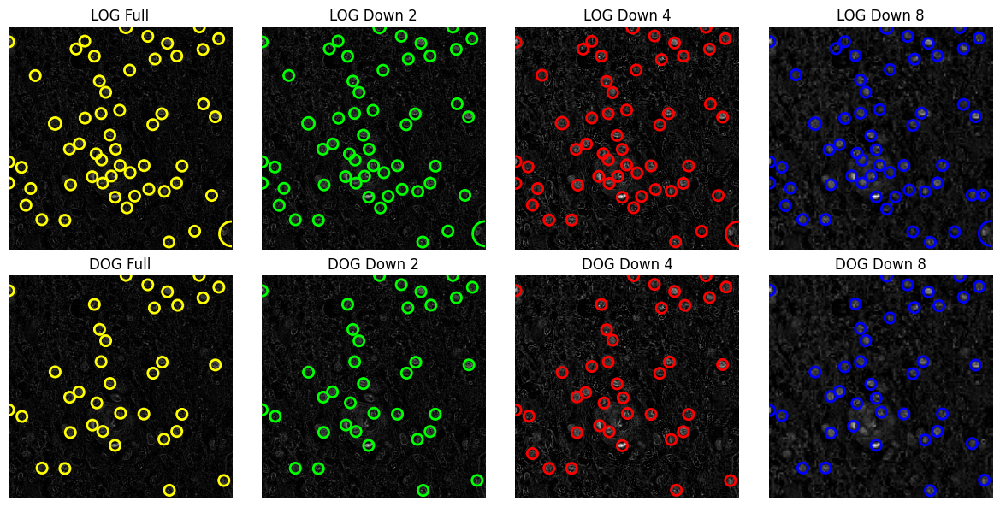

In [90]:
import time
from math import sqrt
from skimage.feature import blob_dog, blob_log
import matplotlib.pyplot as plt

# List to store images for visualization
hem_images = [hem, hem_d2, hem_d4, hem_d8]

timing_results = {}

# Run and time LOG method
start_time = time.time()
blobs_log_full = blob_log(hem, min_sigma=17, max_sigma=40, num_sigma=10, threshold=0.004)
blobs_log_full[:, 2] *= sqrt(2)
timing_results["LOG Full"] = time.time() - start_time

start_time = time.time()
blobs_log_down2 = blob_log(hem_d2, min_sigma=8.5, max_sigma=20, num_sigma=10, threshold=0.004)
blobs_log_down2[:, 2] *= sqrt(2)
timing_results["LOG Down 2"] = time.time() - start_time

start_time = time.time()
blobs_log_down4 = blob_log(hem_d4, min_sigma=4.25, max_sigma=10, num_sigma=10, threshold=0.004)
blobs_log_down4[:, 2] *= sqrt(2)
timing_results["LOG Down 4"] = time.time() - start_time

start_time = time.time()
blobs_log_down8 = blob_log(hem_d8, min_sigma=2.125, max_sigma=5, num_sigma=10, threshold=0.004)
blobs_log_down8[:, 2] *= sqrt(2)
timing_results["LOG Down 8"] = time.time() - start_time

# Run and time DOG method
start_time = time.time()
blobs_dog_full = blob_dog(hem, min_sigma=17, max_sigma=40, threshold=0.004)
blobs_dog_full[:, 2] *= sqrt(2)
timing_results["DOG Full"] = time.time() - start_time

start_time = time.time()
blobs_dog_down2 = blob_dog(hem_d2, min_sigma=8.5, max_sigma=20, threshold=0.004)
blobs_dog_down2[:, 2] *= sqrt(2)
timing_results["DOG Down 2"] = time.time() - start_time

start_time = time.time()
blobs_dog_down4 = blob_dog(hem_d4, min_sigma=4.25, max_sigma=10, threshold=0.004)
blobs_dog_down4[:, 2] *= sqrt(2)
timing_results["DOG Down 4"] = time.time() - start_time

start_time = time.time()
blobs_dog_down8 = blob_dog(hem_d8, min_sigma=2.125, max_sigma=5, threshold=0.004)
blobs_dog_down8[:, 2] *= sqrt(2)
timing_results["DOG Down 8"] = time.time() - start_time

# Print timing results
for key, value in timing_results.items():
    print(f"{key}: {value:.4f} seconds")

# Store blobs and corresponding images
blobs_list = [blobs_log_full, blobs_log_down2, blobs_log_down4, blobs_log_down8, 
              blobs_dog_full, blobs_dog_down2, blobs_dog_down4, blobs_dog_down8]

image_list = hem_images * 2  # Repeat the list to match LOG and DOG images

colors = ['yellow', 'lime', 'red', 'blue', 'yellow', 'lime', 'red', 'blue']
titles = ['LOG Full', 'LOG Down 2', 'LOG Down 4', 'LOG Down 8', 'DOG Full', 'DOG Down 2', 'DOG Down 4', 'DOG Down 8']

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
ax = axes.ravel()

# Loop through images and blobs
for idx, (blobs, img, color, title) in enumerate(zip(blobs_list, image_list, colors, titles)):
    ax[idx].set_title(title)
    ax[idx].imshow(img, cmap='gray')  # Show the corresponding image
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()


In [35]:
from skimage.feature import blob_dog
blobs_dog = ski.feature.blob_dog(hem, min_sigma=17, max_sigma=40, threshold=0.003)


In [36]:
#test
print(len(blobs_dog))

46


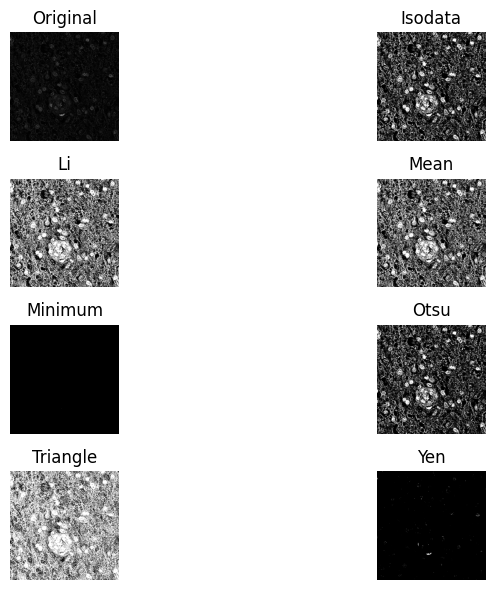

In [37]:
#display
fig, ax = ski.filters.try_all_threshold(hem, figsize=(10, 6), verbose=False)

In [123]:
binary_tri_edit = morphology.remove_small_objects(cleaned_tri_dab, min_size=205)
binary_tri_edit_d2 = morphology.remove_small_objects(cleaned_tri_dab_d2, min_size=100)
binary_tri_edit_d4 = morphology.remove_small_objects(cleaned_tri_dab_d4, min_size=50)
binary_tri_edit_d8 = morphology.remove_small_objects(cleaned_tri_dab_d8, min_size=4)

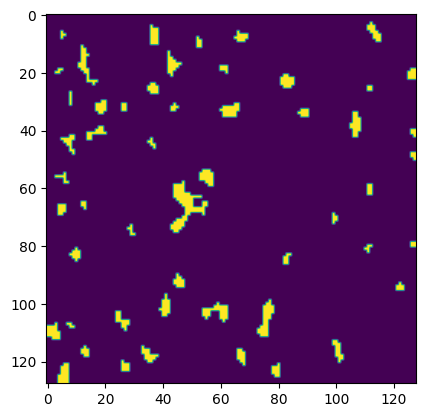

In [124]:
#Display
plt.imshow(binary_tri_edit_d8)

In [125]:
labeled_dab = ski.measure.label(binary_tri_edit)
dab_count = labeled_dab.max()
print(dab_count)

labeled_dab_d2 = ski.measure.label(binary_tri_edit_d2)
dab_count_d2 = labeled_dab_d2.max()
print(dab_count_d2)

labeled_dab_d4 = ski.measure.label(binary_tri_edit_d4)
dab_count_d4 = labeled_dab_d4.max()
print(dab_count_d4)

labeled_dab_d8 = ski.measure.label(binary_tri_edit_d8)
dab_count_d8 = labeled_dab_d8.max()
print(dab_count_d8)

57
45
51
52


In [41]:
heat_dab_count[position_x,position_y] = dab_count
heat_nuc_count[position_x, position_y] = len(blobs_dog)
heat_ratio[position_x,position_y] = dab_count/(len(blobs_dog)+dab_count) if len(blobs_dog)+dab_count != 0 else 0

In [42]:
import matplotlib.pyplot as plt
from omero.gateway import BlitzGateway, MapAnnotationWrapper
import numpy as np
from lavlab.omero.tiles import create_tile_list_from_image, get_tiles, create_tile_list_2d
from lavlab.python_util import create_array
from lavlab.imsuite import imresize
from scipy.ndimage import gaussian_filter
from skimage import filters, measure, color, morphology
from skimage.color import rgb2hsv
from tqdm import tqdm
#
from skimage.color import rgb2hed, hed2rgb
from skimage.exposure import rescale_intensity
import skimage as ski

from skimage.measure import block_reduce
from skimage.morphology import closing, square
from skimage.measure import label
from itertools import islice
import lavlab
from lavlab.omero.images import mask_omero_tissue_loosely
# lavlab.ctx.resources.io_max_threads = 4

conn = BlitzGateway("bchao", "100Freestyle!", host="wss://wsi.lavlab.mcw.edu/omero-wss", port=443, secure=True)
conn.connect()
conn.c.enableKeepAlive(60000000)

image_id = 574

image = conn.getObject("Image", image_id)
if image is None:
    print(f"Image with ID {image_id} not found.")
    conn.close()
    exit()

tile_list = create_tile_list_from_image(image, rgb=True)
#mask_array = mask_omero_tissue_loosely(image)

# Get image dimensions from metadata
image_width = image.getSizeX()
image_height = image.getSizeY()
num_z = image.getSizeZ()
num_c = image.getSizeC()
num_t = image.getSizeT()

heat = np.zeros((int(np.ceil(image_width/1024)), int(np.ceil(image_height/1024))))



In [43]:

tile_lists = zip(*tile_list)
print(tile_list[0])

[(0, 0, 0, (0, 0, 1024, 1024)), (0, 0, 0, (1024, 0, 1024, 1024)), (0, 0, 0, (2048, 0, 1024, 1024)), (0, 0, 0, (3072, 0, 1024, 1024)), (0, 0, 0, (4096, 0, 1024, 1024)), (0, 0, 0, (5120, 0, 1024, 1024)), (0, 0, 0, (6144, 0, 1024, 1024)), (0, 0, 0, (7168, 0, 1024, 1024)), (0, 0, 0, (8192, 0, 1024, 1024)), (0, 0, 0, (9216, 0, 1024, 1024)), (0, 0, 0, (10240, 0, 1024, 1024)), (0, 0, 0, (11264, 0, 1024, 1024)), (0, 0, 0, (12288, 0, 1024, 1024)), (0, 0, 0, (13312, 0, 1024, 1024)), (0, 0, 0, (14336, 0, 1024, 1024)), (0, 0, 0, (15360, 0, 1024, 1024)), (0, 0, 0, (16384, 0, 1024, 1024)), (0, 0, 0, (17408, 0, 1024, 1024)), (0, 0, 0, (18432, 0, 1024, 1024)), (0, 0, 0, (19456, 0, 1024, 1024)), (0, 0, 0, (20480, 0, 1024, 1024)), (0, 0, 0, (21504, 0, 1024, 1024)), (0, 0, 0, (22528, 0, 1024, 1024)), (0, 0, 0, (23552, 0, 1024, 1024)), (0, 0, 0, (24576, 0, 1024, 1024)), (0, 0, 0, (25600, 0, 1024, 1024)), (0, 0, 0, (26624, 0, 1024, 1024)), (0, 0, 0, (27648, 0, 1024, 1024)), (0, 0, 0, (28672, 0, 1024, 1024)

In [44]:
tile_list[0]

[(0, 0, 0, (0, 0, 1024, 1024)),
 (0, 0, 0, (1024, 0, 1024, 1024)),
 (0, 0, 0, (2048, 0, 1024, 1024)),
 (0, 0, 0, (3072, 0, 1024, 1024)),
 (0, 0, 0, (4096, 0, 1024, 1024)),
 (0, 0, 0, (5120, 0, 1024, 1024)),
 (0, 0, 0, (6144, 0, 1024, 1024)),
 (0, 0, 0, (7168, 0, 1024, 1024)),
 (0, 0, 0, (8192, 0, 1024, 1024)),
 (0, 0, 0, (9216, 0, 1024, 1024)),
 (0, 0, 0, (10240, 0, 1024, 1024)),
 (0, 0, 0, (11264, 0, 1024, 1024)),
 (0, 0, 0, (12288, 0, 1024, 1024)),
 (0, 0, 0, (13312, 0, 1024, 1024)),
 (0, 0, 0, (14336, 0, 1024, 1024)),
 (0, 0, 0, (15360, 0, 1024, 1024)),
 (0, 0, 0, (16384, 0, 1024, 1024)),
 (0, 0, 0, (17408, 0, 1024, 1024)),
 (0, 0, 0, (18432, 0, 1024, 1024)),
 (0, 0, 0, (19456, 0, 1024, 1024)),
 (0, 0, 0, (20480, 0, 1024, 1024)),
 (0, 0, 0, (21504, 0, 1024, 1024)),
 (0, 0, 0, (22528, 0, 1024, 1024)),
 (0, 0, 0, (23552, 0, 1024, 1024)),
 (0, 0, 0, (24576, 0, 1024, 1024)),
 (0, 0, 0, (25600, 0, 1024, 1024)),
 (0, 0, 0, (26624, 0, 1024, 1024)),
 (0, 0, 0, (27648, 0, 1024, 1024)),
 (0, 